
1. Capture a raw image with your camera. Demosaic the image and adjust the colors and gain such that the scene appears natural.

2. Conver the RGB raw image to YCbCr

3. Down sampe the Cb and Cr planes by a factor of 2. At this point your image should consist of 1 4K Y plane and 2 HD resolution Cb and Cr planes. By what factor has the image data size been reduced compared to 3 4K planes?

4. For the remaining steps, lets work only with the Y channel. Choose a 512 by 512 pixel sub region of the image for the following steps:

a. Divide the 512 by 512 image in to a 64 by 64 set of 8 by 8 subimages. Take the DCT of each subimage

b. Divide each DCT image by a jpeg quantization matrix

c. round the resulting image to integers. 

d. Determine how many of the resulting 262144 values are nonzero. If all of the zeros could be discarded, by what factor could the image be compressed?

5. take the inverse DCT of the rounded values from part 4. Put them together to rebuild the original Y channel image. How does the image compare with the original?

6. Upsample the previously downsampled Cb and Cr planes to match the resolution of the Y channel iamge from 5. Convert the resulting image back to RGB. How does your decompressed image compare to the original raw RGB image?

In [2]:
def grabImage(sid=1, imres=8, fm=1, cameraNumber=6):
    # I will use the file name dbGrab.... for the image grabbed from the camera. First step is to get rid of previously grabbed images
    cmdA='ssh ubuntu@10.0.1.'+str(cameraNumber)
    cmdB='scp ubuntu@10.0.1.'+str(cameraNumber)
    subprocess.run('rm dbGrab*', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run('rm *raw', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm dbGrab*"', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm *.raw"', \
                   stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab an image on the tegra
    cmD=cmdA+' "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --dump-bayer\
                    --file-name dbGrab --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':dbGrab* .', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':*.raw .', \
                   stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    if fm==1:
        fileName = re.search(r'dbGrab(.*).jpg', rePop)
        fileName=fileName.group()
        pop=imio.imread(fileName)
    else:
        fileName = re.search(r'(.*).raw', rePop)
        fileName=fileName.group()
        pop=np.fromfile(fileName,dtype=np.dtype('i2'))
        pop=pop[250416:]
        pop=np.reshape(pop,(2174,3864))
       # pop=np.append(pop[:,2060:] ,pop[:,:2060],axis=1)
    return pop

In [16]:
def demosaic(rawImage):
    red=rawImage[0:2174:2,1:3864:2]
    redU=interp.RectBivariateSpline(np.arange(0,1087),np.arange(0,1932),red)
    red=redU(np.arange(0,1087,.5),np.arange(0,1932,.5))
    red=np.append(red[:,744:] ,red[:,:744],axis=1)
    blue=rawImage[1:2174:2,0:3864:2]
    blueU=interp.RectBivariateSpline(np.arange(0,1087),np.arange(0,1932),blue)
    blue=blueU(np.arange(0,1087,.5),np.arange(0,1932,.5))
    blue=np.append(blue[:,744:] ,blue[:,:744],axis=1)
    green=rawImage;
    for er in range(1,2173,2):
        for odr in range(0,3862,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    for er in range(0,2172,2):
        for odr in range(1,3861,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    green=np.append(green[:,744:] ,green[:,:744],axis=1)
    imageOut=np.dstack((red,green,blue))
    imageOut=255*imageOut/np.max(imageOut)
    imageOut=imageOut.astype(np.uint8)
    return imageOut

def adjustColor(inputImage,rc=1,bc=1,gc=1,gain=1,contrast=1):
    fI=inputImage.astype(np.float)
    fI[:,:,0]=rc*fI[:,:,0]
    fI[:,:,1]=gc*fI[:,:,1]
    fI[:,:,2]=bc*fI[:,:,2]
    fI=gain*fI/np.max(fI)
    fI=255*np.tanh(contrast*fI)
    fI=fI.astype(np.uint8)
    return fI

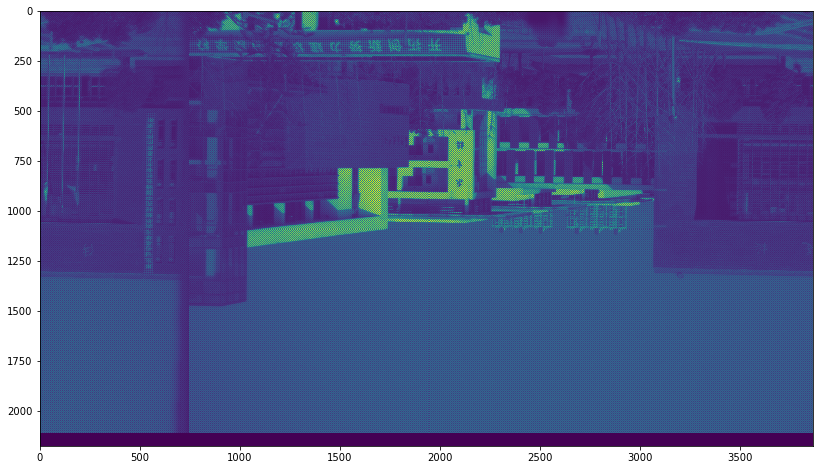

In [35]:
a = grabImage(sid=0, fm=2, cameraNumber=8)
plt.imshow(a)

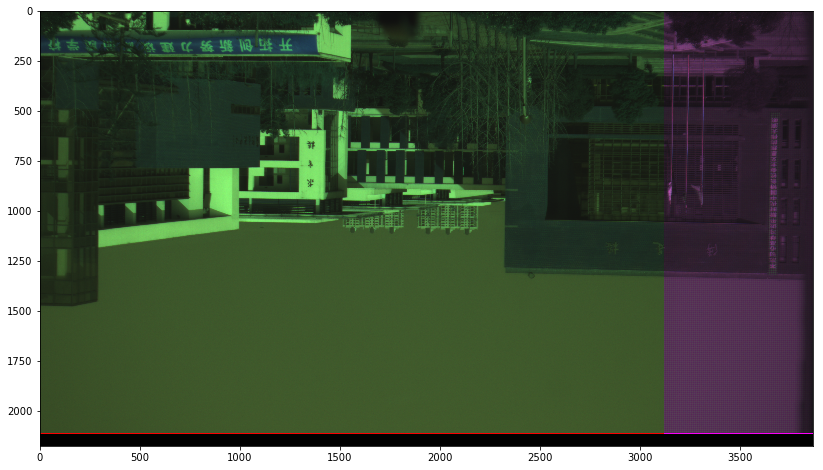

In [36]:
b=demosaic(a)
plt.imshow(b)

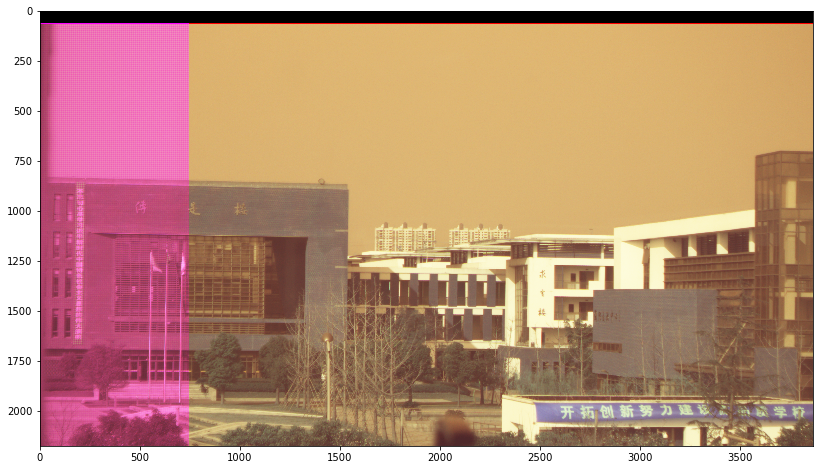

In [37]:
c = adjustColor(b ,rc=0.95,bc=0.5,gc=0.45,gain=1.8,contrast=3)
c = trans.rotate(c,180)
plt.imshow(c)

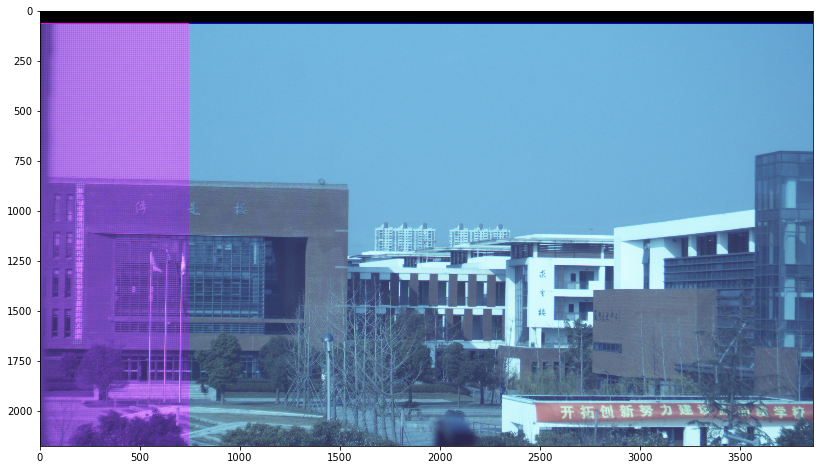

In [42]:
for i in c:
    for j in i:
        r,g,b = j
        j[0]=b
        j[2]=r
plt.imshow(c)

In [12]:
import skimage.color as cp
# def rgb2ycbcr(im):
#     cbcr = np.empty_like(im)
#     r = im[:,:,0]
#     g = im[:,:,1]
#     b = im[:,:,2]
#     # Y
#     cbcr[:,:,0] = .299 * r + .587 * g + .114 * b
#     # Cb
#     cbcr[:,:,1] = 128 - .169 * r - .331 * g + .5 * b
#     # Cr
#     cbcr[:,:,2] = 128 + .5 * r - .419 * g - .081 * b
#     return np.uint8(cbcr)


/Users/yeko/anaconda/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


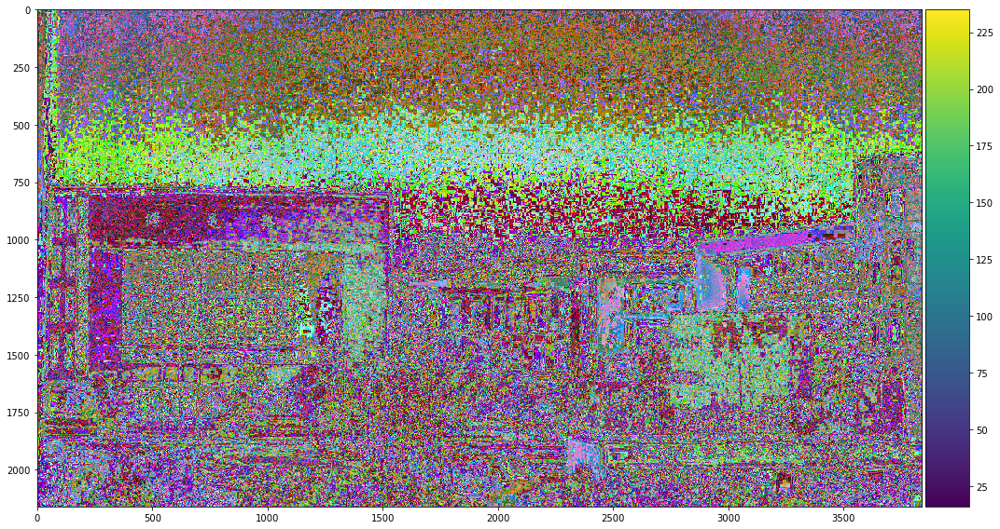

In [74]:
a_jpg=imio.imread('dbGrab_2726_s00_00000.jpg')
e=cp.rgb2ycbcr(a_jpg)
imio.imshow(e)

/Users/yeko/anaconda/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


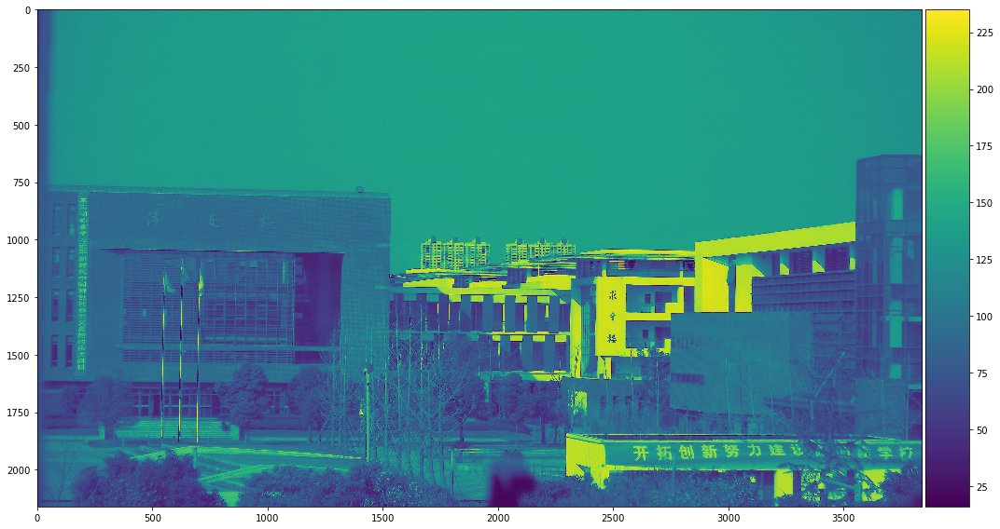

In [75]:
imio.imshow(e[:,:,0])

/Users/yeko/anaconda/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


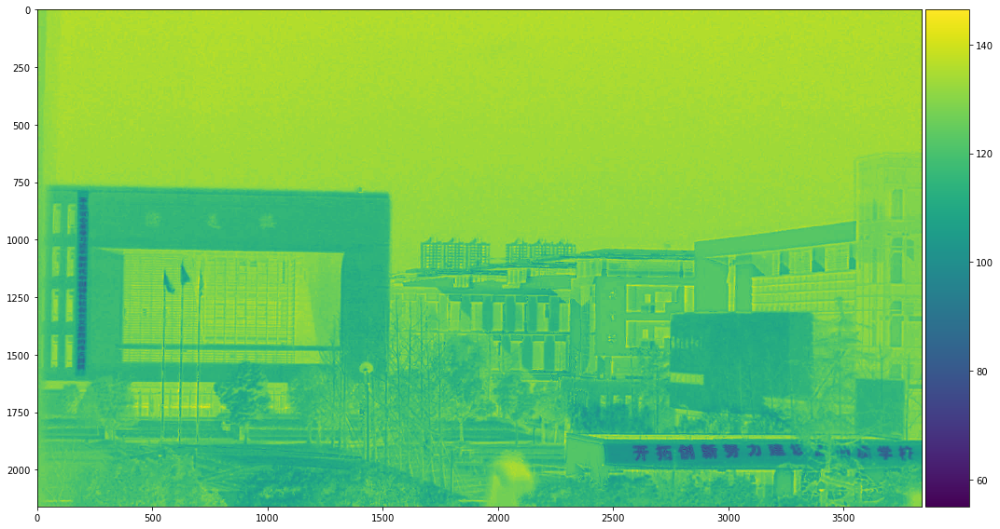

In [77]:
imio.imshow(e[:,:,1])

In [1]:
def RawPixelSamples(sid=2, imres=8, cameraNumber=2, frames=100, samplePixels=10000):
    cmdA='rsh ubuntu@10.0.1.'+str(cameraNumber)
    cmdB='rcp ubuntu@10.0.1.'+str(cameraNumber)
    pixels=np.random.randint(250416,2160*3840,samplePixels)
    subprocess.run('rm dbGrab*', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run('rm *raw', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm dbGrab*"', \
                   stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdA+' "rm *.raw"', \
                   stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab some images on the tegra
    cmD=cmdA+' "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto -C '+str(frames)+' --dump-bayer\
    --capture-gap 500 --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run(cmdB+':*.raw .', \
                   stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    fileName = re.findall(r'(.*).raw', rePop)
    pop=np.fromfile(fileName[0]+'.raw',dtype=np.dtype('i2'))
    pixelValues=pop[pixels]
    for index in range(1,len(fileName)):
        pop=np.fromfile(fileName[index]+'.raw',dtype=np.dtype('i2'))
        pixelValues=np.vstack((pixelValues,pop[pixels]))
                              
    return pixelValues

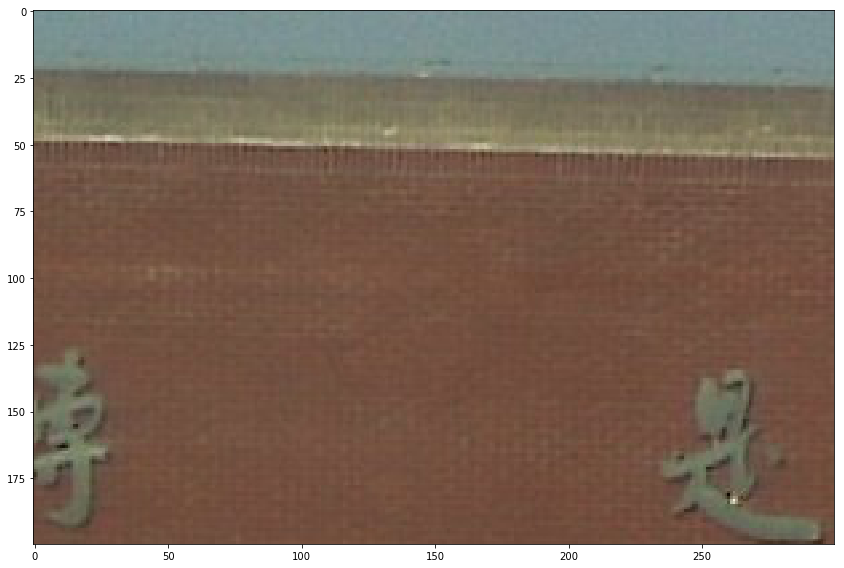

In [6]:
pop=imio.imread('dbGrab_2726_s00_00000.jpg')
imio.imshow(pop[750:950,500:800,:])

In [9]:
pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
rePop=pop.stdout
rePop=rePop.decode("utf-8")
fileName = re.search(r'(.*).raw', rePop)
fileName=fileName.group()
pop=np.fromfile(fileName,dtype=np.dtype('i2'))
pop=pop[250416:]
pop=np.reshape(pop,(2174,3864))

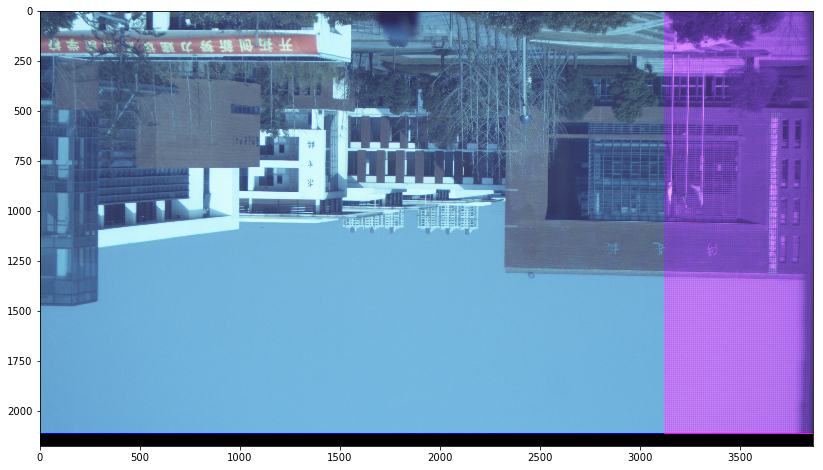

In [17]:
b=demosaic(pop)
c = adjustColor(b ,rc=0.95,bc=0.5,gc=0.45,gain=1.8,contrast=3)
for i in c:
    for j in i:
        r,g,b = j
        j[0]=b
        j[2]=r
plt.imshow(c)

/Users/yeko/anaconda/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


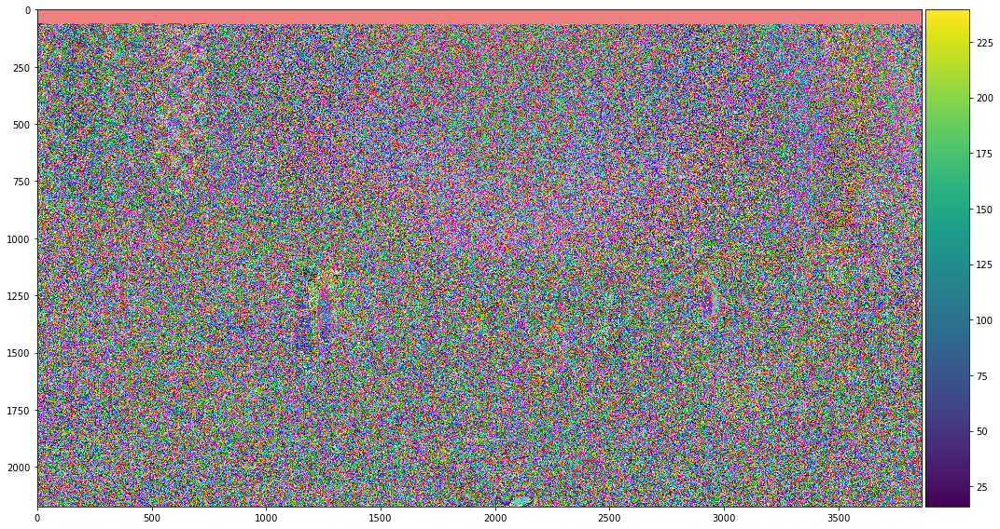

In [18]:
c = trans.rotate(c,180)
d=cp.rgb2ycbcr(c)
imio.imshow(d)

/Users/yeko/anaconda/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


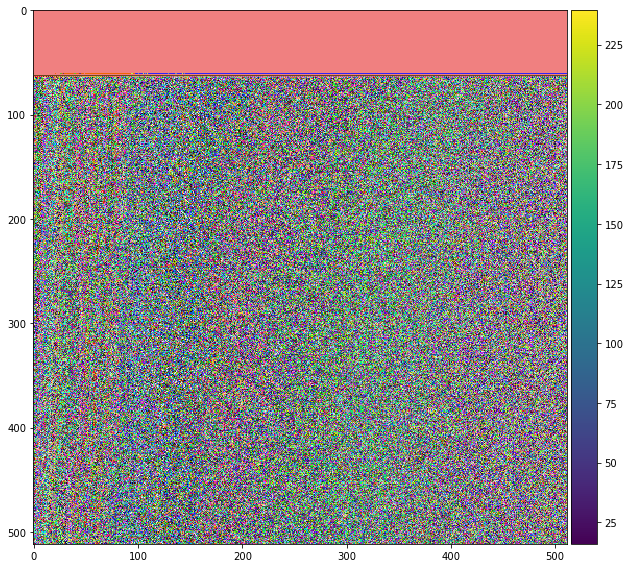

In [20]:
Y = d[:,:,0]
Cb = d[:,:,1]
Cr = d[:,:,2]
DS_Cb = np.array([[0 for i in range(1087)] for j in range(1432)])
DS_Cb= d[0:2174:2,0:2864:2,1]
DS_Cr = np.array([[0 for i in range(1087)] for j in range(1432)])
DS_Cr= d[0:2174:2,0:3864:2,2]
imio.imshow(d[0:512,0:512,:])

In [21]:
DS_Cb.shape
DS_Cr.shape
#The image size is (1087, 1932) after downsampling

(1087, 1932)

In [22]:
from scipy.fftpack import dct

def dct2D(x):
    tmp = dct(x, type=2 ,norm='ortho').transpose()
    return dct(tmp, type=2 ,norm='ortho').transpose()

In [49]:
YSample=Y[0:512, 0:512]
sub=[[0 for i in range(8)] for j in range(8)]
block=[[subone for i in range(64)] for j in range(64)]
sub=np.array(sub)
block=np.array(block)

In [50]:
for i in range(0,64):
    for j in range(0,64):
        for m in range(8):
            for n in range(8):
                block[i,j,m,n]=YSample[i*8+m,j*8+n]

In [54]:
DCT_YB=block
DCT=block
#Idon't know why but my mates just tell me this matrix :(
Qmatrix=[[16,11,10,16,24,40,51,61],[12,12,14,19,26,58,60,55],[14,13,16,24,40,57,69,56],[14,17,22,29,51,87,80,62],[18,22,37,56,68,109,103,77],[24,35,55,64,81,104,113,92],[49,64,78,87,103,121,120,101],[72,92,95,98,112,100,103,99]]
Qmatrix=np.array(Qmatrix)
DCT = dct2D(block)  
for i in range(64):
    for j in range(64):
        DCT_YB[i,j] = DCT[i,j]/Qmatrix
        

[[[[100  -1   2 ...,   0   0   0]
   [134   3   5 ...,   0   0   0]
   [115  -1   1 ...,   0   0   0]
   ..., 
   [ 67   1   1 ...,   0   0   0]
   [ 33   0   0 ...,   0   0   0]
   [ 22   0   0 ...,   0   0   0]]

  [[107  -2   0 ...,   0   0   0]
   [139  -1   0 ...,   0   0   0]
   [123  -2   0 ...,   0   0   0]
   ..., 
   [ 69   0   0 ...,   0   0   0]
   [ 36   0   0 ...,   0   0   0]
   [ 23   0   0 ...,   0   0   0]]

  [[114  -1   0 ...,   0   0   0]
   [147  -1   0 ...,   0   0   0]
   [130  -1   0 ...,   0   0   0]
   ..., 
   [ 73   0   0 ...,   0   0   0]
   [ 37   0   0 ...,   0   0   0]
   [ 24   0   0 ...,   0   0   0]]

  ..., 
  [[190   1   0 ...,   0   0   1]
   [238   1   0 ...,   0   0   1]
   [217   1   0 ...,   0   0   1]
   ..., 
   [119   0   0 ...,   0   0   1]
   [ 62   0   0 ...,   0   0   0]
   [ 39   0   0 ...,   0   0   0]]

  [[190   1   0 ...,   0   0   1]
   [238   1   0 ...,   0   0   1]
   [217   1   0 ...,   0   0   1]
   ..., 
   [119   0   0 ..., 

In [57]:
num=0
for i in range(64):
    for j in range(64):
        for m in range(8):
            for n in range(8):
                if DCT_YB[i,j,m,n]==0:
                    num = num + 1
print('zero: ',num)
print('nonzero: ',512*512-num)
print('compression factor: ', int(512*512/(512*512-num)))

zero:  241738
nonzero:  20406
compression factor:  12


In [60]:
from scipy.fftpack import idct

def indct(x):
    tep=idct(x,type=2,norm='ortho').transpose()
    return idct(tep,type=2,norm='ortho').transpose()

RE_Y = indct(DCT)        
RE_Y = np.round(RE_Y)

/Users/yeko/anaconda/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


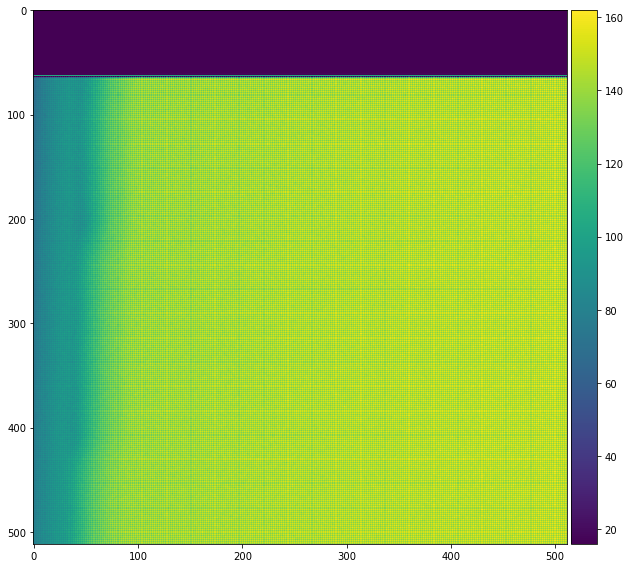

In [62]:
Y_RE=[[0 for i in range(512)] for j in range(512)]
Y_RE=np.array(Y_RE)

for i in range(64):
    for j in range(64):
        for m in range(8):
            for n in range(8):
                Y_RE[i*8+m,j*8+n] = RE_Y[i,j,m,n]                
              
imio.imshow(Y_RE)

/Users/yeko/anaconda/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:77: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  warn("Float image out of standard range; displaying "


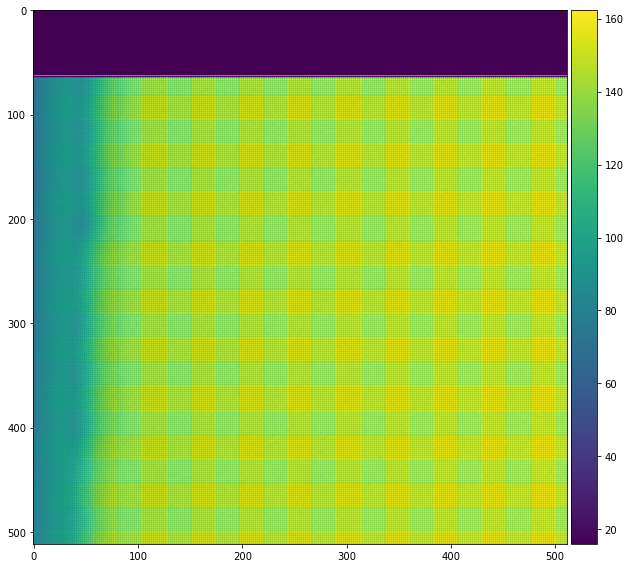

In [63]:
imio.imshow(YSample)

In [69]:
Channel=[0,0,0]
RE_Img = np.array([[Channel for i in range(512)] for j in range(512)])

cube = np.array([[1,2],[3,4]])

Cb_RE = np.array([[cube for i in range(256)] for j in range(256)])
Cr_RE = np.array([[cube for i in range(256)] for j in range(256)])

CCb=np.array(d[0:512:2,0:512:2,1])
CCr=np.array(d[0:512:2,0:512:2,2])

Cr=np.array([[0 for i in range(512)] for j in range(512)],dtype='uint8')
Cb=np.array([[0 for i in range(512)] for j in range(512)],dtype='uint8')

for i in range(256):
    for j in range(256):
        for m in range(2):
            for n in range(2):
                Cr[i*2+m,j*2+n] = Cr_RE[i,j,m,n]
                Cb[i*2+m,j*2+n] = Cb_RE[i,j,m,n]
        
for i in range(512):
    for j in range(512):
        RE_Img[i,j,0]=Y_RE[i,j]
        RE_Img[i,j,1]=Cb[i,j]
        RE_Img[i,j,2]=Cr[i,j]
        
RE_Img = np.array(RE_Img,dtype='uint8')

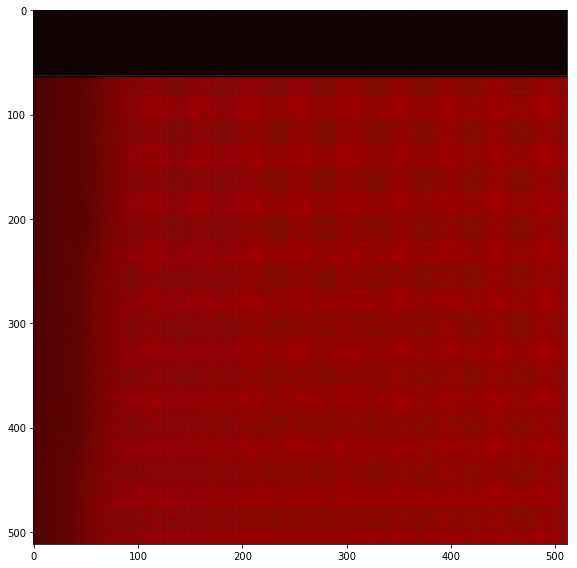

In [70]:
R = RE_Img
imio.imshow(R)

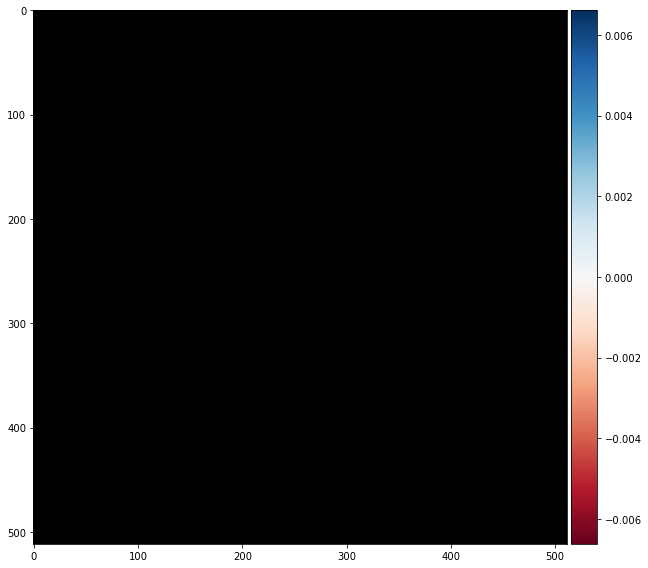

In [71]:
dd = cp.ycbcr2rgb(R)
imio.imshow(dd)

In [ ]:
#the output is kind of weird